In [30]:
# The goals/steps of this project are the following:

#    - Compute the camera calibration matrix and distortion coefficients given a set of chessboard images. (DONE)
#    - Apply a distortion correction to raw images. (DONE)
#    - Use color transforms, gradients, etc., to create a thresholded binary image. (DONE) 
#    - Apply a perspective transform to rectify binary image ("birds-eye view"). (DONE)
#    - Detect lane pixels and fit to find the lane boundary. (DONE)
#    - Determine the curvature of the lane and vehicle position with respect to center. (DONE)
#    - Warp the detected lane boundaries back onto the original image. (DONE)
#    - Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os

# set calibration images folder and paths
cal_images_dir = './camera_cal'
cal_images = os.listdir(cal_images_dir)
# set test images folder
test_images_dir = './test_images'
test_images = os.listdir(test_images_dir)

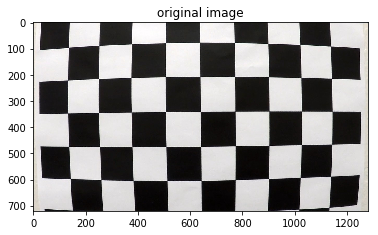

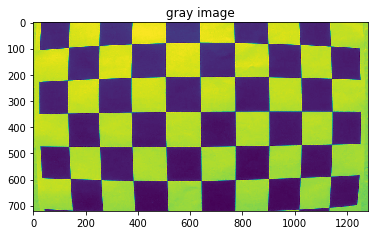

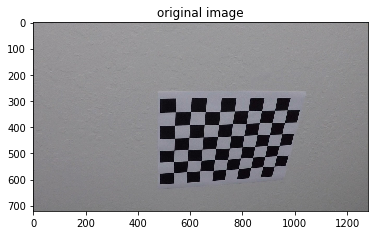

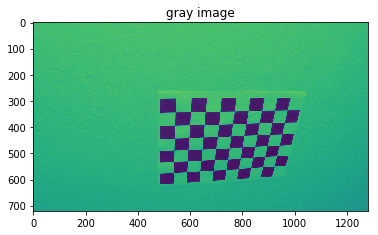

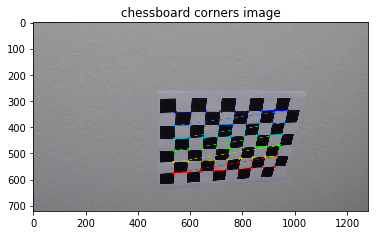

...

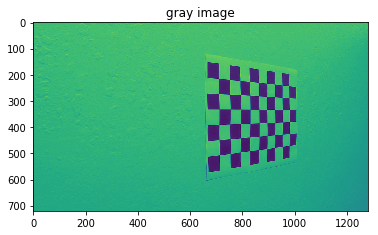

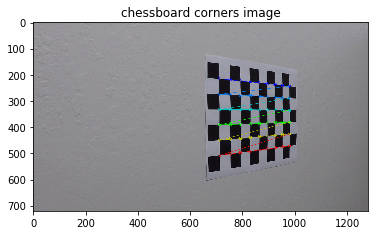

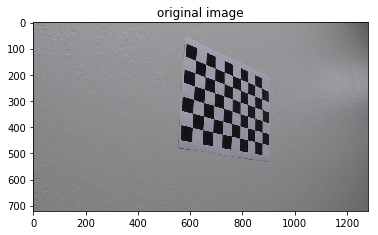

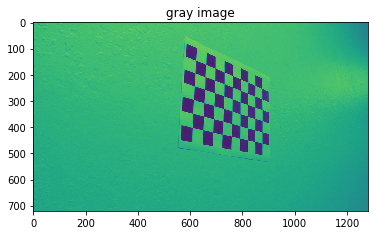

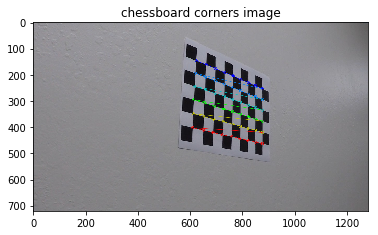

In [112]:
# ========================== FIND CHESSBOARD CORNERS ============================

import cv2
import numpy as np
import matplotlib.pyplot as plt

# number of inside corners 
nx = 9
ny = 6

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny*nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

for img_path in cal_images:
    # get image full path
    full_path = os.path.join(cal_images_dir, img_path)
    # Read and display original image
    image = mpimg.imread(full_path)
    plt.imshow(image)
    plt.title('original image')
    plt.show()
    
    # Convert image to gray and display
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    plt.imshow(gray)
    plt.title('gray image')
    plt.show()
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    if ret == True:
        # add points to imagpoints array
        imgpoints.append(corners)
        objpoints.append(objp)
        # Draw and display the corners
        cv2.drawChessboardCorners(image, (nx, ny), corners, ret)
        plt.imshow(image)
        plt.title('chessboard corners image')
        plt.show()
    



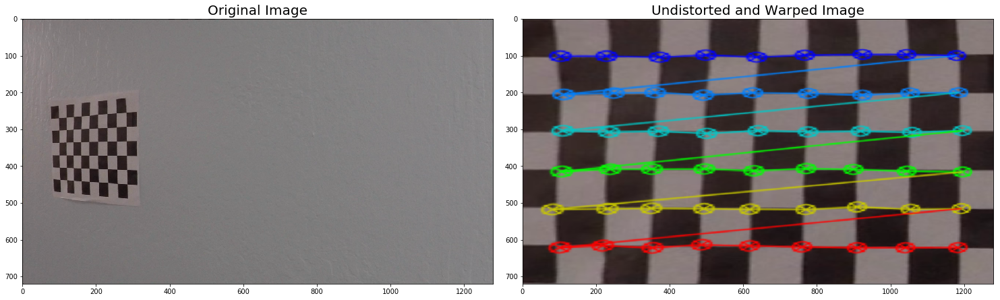

In [5]:
# ========================== CAMERA CALIBRATION UNDISTORT ============================

# Apply a distortion correction to raw images.

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import math


def corners_unwarp(img, nx, ny, mtx, dist):
    # Pass in your image into this function
    # Write code to do the following steps
    # 1) Undistort using mtx and dist
    undist_img = cv2.undistort(img, mtx, dist, None, mtx)
    # 2) Convert to grayscale
    gray_img = cv2.cvtColor(undist_img, cv2.COLOR_BGR2GRAY) 
    # 3) Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray_img,(nx, ny), None )
    # 4) If corners found:
    if ret == True:
        # a) draw corners
        cv2.drawChessboardCorners(undist_img, (nx,ny), corners, ret)
        # b) define 4 source points src = np.float32([[,],[,],[,],[,]])
        #Note: you could pick any four of the detected corners 
        # as long as those four corners define a rectangle
        #One especially smart way to do this would be to use four well-chosen
        # corners that were automatically detected during the undistortion steps
        #We recommend using the automatic detection of corners in your code
        offset = 100
        img_size = (gray_img.shape[1], gray_img.shape[0])
                 
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # c) define 4 destination points dst = np.float32([[,],[,],[,],[,]])
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                          [img_size[0]-offset, img_size[1]-offset], 
                          [offset, img_size[1]-offset]])
        # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # e) use cv2.warpPerspective() to warp your image to a top-down view
        warped = cv2.warpPerspective(undist_img, M, img_size)
        
    return warped, M



# get cal image full path
full_path = os.path.join(cal_images_dir, cal_images[2])
# read image
img = cv2.imread(full_path)
# Get image shape 
img_size = (img.shape[1], img.shape[0])

# Do camera calibration with object points and image points from chessboard calculations
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)


# undistorted image destination
top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

straight_lines1.jpg


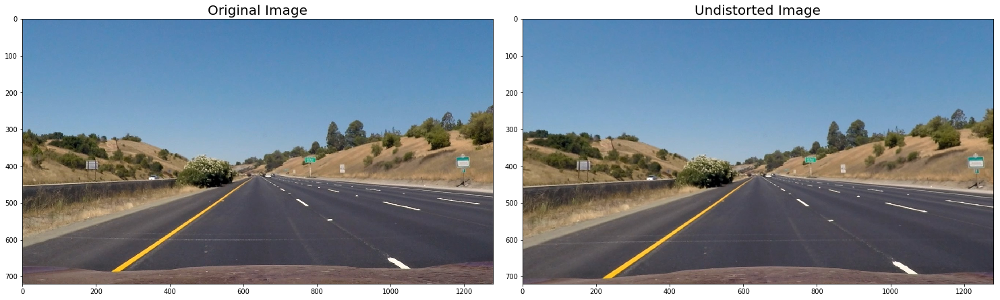

(680, 1280, 3)


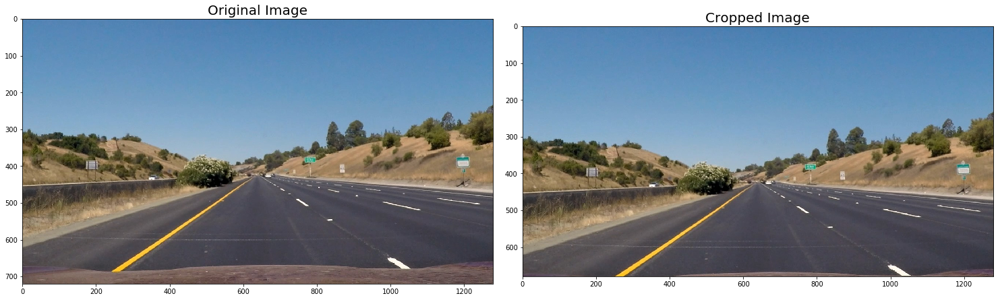

bottom right x =  1103.0


TypeError: Image data can not convert to float

In [116]:
# ========================== Undistort Image =================================
# Load sample image
# Choose an image from which to build and demonstrate each step of the pipeline
full_path = os.path.join(test_images_dir, test_images[0])
exampleImg = plt.imread(full_path)
print(test_images[0])


# Using mtx, dist from calibration above
def undistort_img(image, mtx, dist):
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    return undist
    
# test function
undist_exampleImg = undistort_img(exampleImg, mtx, dist)
# plot undistorted image
# undistorted image destination
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
f.tight_layout()
ax1.imshow(exampleImg)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(undist_exampleImg)
ax2.set_title('Undistorted Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

# cropping impelmentation
def crop_img(img, start_y, end_y, start_x, end_x):
    cropped_img = img[start_y:end_y, start_x:end_x]
    return cropped_img

# test cropping function
cropped_exampleImg = crop_img(exampleImg, 0, 680, 0, 1280)
print(cropped_exampleImg.shape)
# plot cropped image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
f.tight_layout()
ax1.imshow(exampleImg)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(cropped_exampleImg )
ax2.set_title('Cropped Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()


# unwarp method. Assumes the follwing:
#    - Road always flat
#    - Fixed camera position
def unwarp(img, src, dst):
    h,w = img.shape[:2]
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped, M, Minv

    
# selecting src and dst points and drawing them on image
# source points to enclose lane line in a trapezoid.

offset_x = 20
offset_y = 5

bottom_left_y = cropped_exampleImg.shape[0] - offset_y
bottom_left_x = cropped_exampleImg.shape[1]//5.12
#print('bottom left x = ', bottom_left_x)
#print('bottom left y = ', bottom_left_y)


top_left_y = cropped_exampleImg.shape[0]//1.54
top_left_x = cropped_exampleImg.shape[1]//2 - offset_x
#print('top left x = ', top_left_x)
#print('top left y = ', top_left_y)

top_right_y = cropped_exampleImg.shape[0]//1.54
top_right_x = cropped_exampleImg.shape[1]//2 + offset_x
#print('top right x = ', top_right_x)
#print('top right y = ', top_right_y)

bottom_right_y = cropped_exampleImg.shape[0] - offset_y
bottom_right_x = cropped_exampleImg.shape[1]//1.16
print('bottom right x = ', bottom_right_x)
#print('bottom right y = ', bottom_right_y)
# Store source points
src = np.float32([[top_left_x, top_left_y],
                  [top_right_x, top_right_y],
                  [bottom_right_x, bottom_right_y],
                  [bottom_left_x, bottom_left_y]])
# destination points to display warp image
dst = np.float32([[200, 0],
                 [1100, 0],
                 [1100, 720],
                 [200, 720]])

# test method
unwarp_exampleImg = unwarp(img, src, dst)
#print(unwarp_exampleImg)
#plt.imshow(unwarp_exampleImg)
#plt.show()

# draw rectangle 
#cv2.polylines(cropped_exampleImg, np.int32([src]), isClosed=True, color=(0,255,255), thickness=5)
plt.imshow(unwarp_exampleImg )
plt.plot(top_left_x, top_left_y, '.')
plt.plot(bottom_left_x, bottom_left_y, '.')
plt.plot(top_right_x, top_right_y, '.')
plt.plot(bottom_right_x, bottom_right_y, '.')
plt.show()

# plot abs_sobel_binary image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
f.tight_layout()
ax1.imshow(exampleImg)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(abs_sobel_exampleImg,  cmap='gray' )
ax2.set_title('Abs_sobel_binary Image', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()


bottom right x =  1103.0


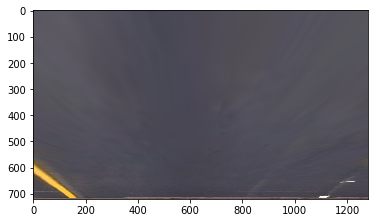

bottom right x =  1103.0


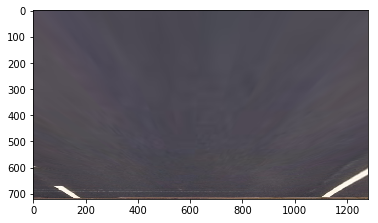

bottom right x =  1103.0


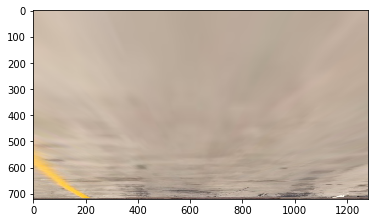

bottom right x =  1103.0


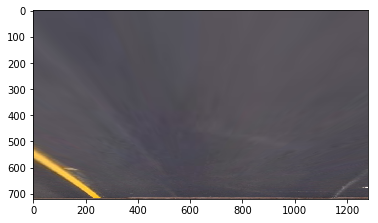

bottom right x =  1103.0


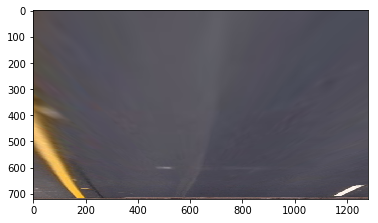

bottom right x =  1103.0


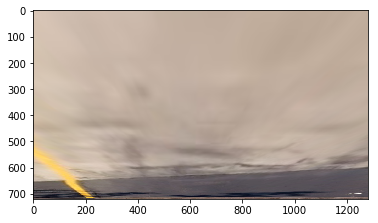

bottom right x =  1103.0


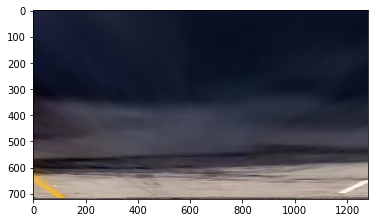

bottom right x =  1103.0


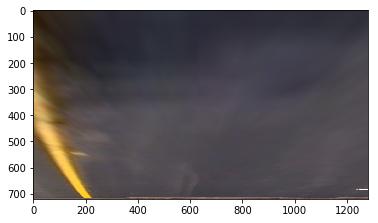

In [109]:
# ========================== PERSPECTIVE TRANSFORM ============================

import os

def perspective_transform(img):
    
    h, w = img.shape[:2]
    
    offset_x = 20
    offset_y = 5

    bottom_left_y = img.shape[0] - offset_y
    bottom_left_x = img.shape[1]//5.12
    #print('bottom left x = ', bottom_left_x)
    #print('bottom left y = ', bottom_left_y)


    top_left_y = img.shape[0]//1.54
    top_left_x = cropped_exampleImg.shape[1]//2 - offset_x
    #print('top left x = ', top_left_x)
    #print('top left y = ', top_left_y)

    top_right_y = img.shape[0]//1.54
    top_right_x = img.shape[1]//2 + offset_x
    #print('top right x = ', top_right_x)
    #print('top right y = ', top_right_y)
    
    bottom_right_y = img.shape[0] - offset_y
    bottom_right_x = img.shape[1]//1.16
    print('bottom right x = ', bottom_right_x)
    #print('bottom right y = ', bottom_right_y)
    # Store source points
    src = np.float32([[top_left_x, top_left_y],
                      [top_right_x, top_right_y], 
                      [bottom_right_x, bottom_right_y],
                      [bottom_left_x, bottom_left_y]])
    # destination points to display warp image
    dst = np.float32([[200, 0],
                      [1100, 0],
                      [1100, 720],
                      [200, 720]])

    M = cv2.getPerspectiveTransform(src, dst)
    
    warped = cv2.warpPerspective(img, M, dsize = (w, h), flags = cv2.INTER_LINEAR)
    return warped


images = os.listdir('./test_images') 

for fname in images:
    fname = os.path.join('test_images',fname)
    img = mpimg.imread(fname)
    #img = cv2.resize(img, (720, 405))
    #img = cv2.undistort(img, mtx, dist, None, mtx)
    warped = perspective_transform(img)
    #f, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 5))
    #f.tight_layout()
    #ax1.imshow(img)
    #ax1.set_title('Undistorted Image', fontsize=20)
    #ax2.imshow(warped)
    #ax2.set_title('Transformed', fontsize=20)
    #plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.imshow(warped)
    plt.show()

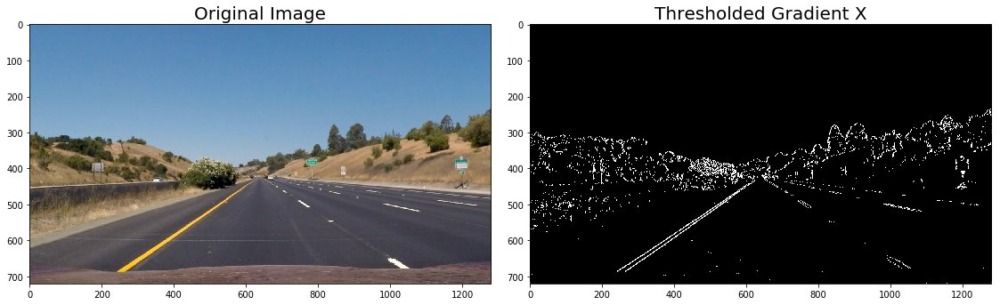

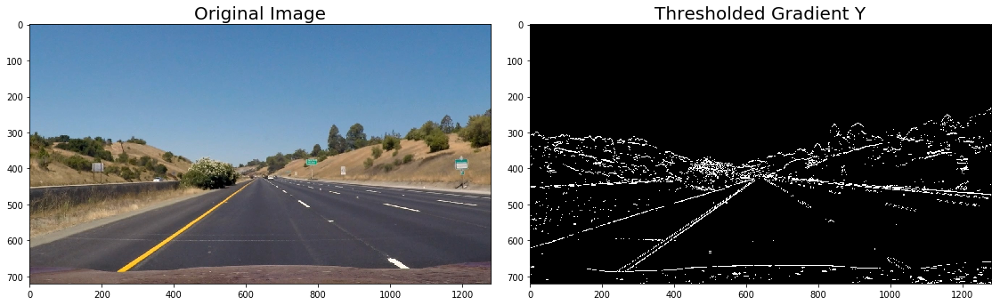

In [8]:
# ========================== SOBEL GRADIENT ABSOLUTE (X,Y) THRESHOLD ============================
# Applies Sobel gradients to x and y

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle


# Read in an image and grayscale it
image = mpimg.imread('test_images/straight_lines1.jpg')
#image = cv2.imread('test_images/test1.jpg')
#image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if(orient == 'x'):
        sobel_derivative = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0)
        
    else:
        sobel_derivative = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1)
    # 3) Take the absolute value of the derivative or gradient
    sobel_abs = np.absolute(sobel_derivative)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    sobel_scaled = np.uint8(255*sobel_abs/np.max(sobel_abs))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(sobel_scaled)
    binary_output[(sobel_scaled >= thresh_min) & (sobel_scaled <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return binary_output
    
# get the gradient for X
grad_x_binary = abs_sobel_thresh(image, orient='x', thresh_min=30, thresh_max=100)
grad_y_binary = abs_sobel_thresh(image, orient='y', thresh_min=30, thresh_max=100)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(grad_x_binary, cmap='gray')
ax2.set_title('Thresholded Gradient X', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(grad_y_binary, cmap='gray')
ax2.set_title('Thresholded Gradient Y', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()



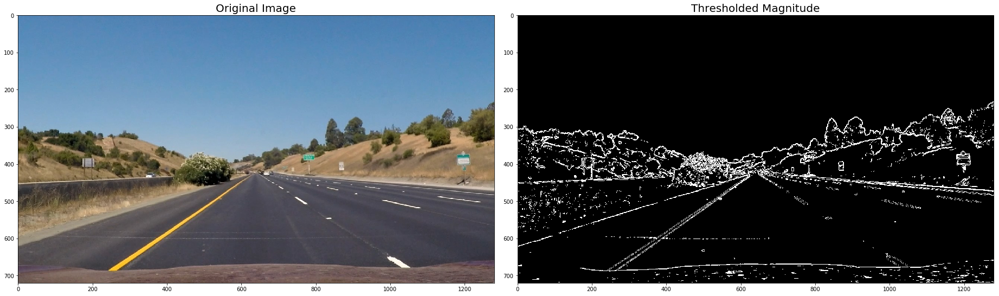

In [9]:
# ========================== SOBEL GRADIENT MAGNITUDE THRESHOLD ============================
# Calculate gradients and magnitude for the x and y and scale them
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import math


# Read in an image
image = mpimg.imread('test_images/straight_lines1.jpg')

# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=9, mag_thresh=(30, 100)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    gradient_magnitude = np.sqrt(sobel_x ** 2 + sobel_y ** 2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradient_magnitude)/255
    scaled_grad_magnitude = (gradient_magnitude/scale_factor).astype(np.uint8)
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_grad_magnitude)
    binary_output[(scaled_grad_magnitude > mag_thresh[0]) & (scaled_grad_magnitude < mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return binary_output
    
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=20)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

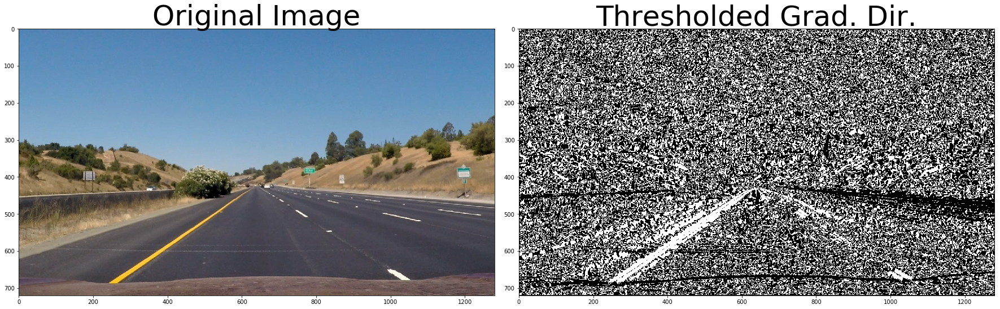

In [10]:
# ========================== SOBEL GRADIENT DIRECTION THRESHOLD ============================
# find the direction of the gradient
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle


# Read in an image
image = mpimg.imread('test_images/straight_lines1.jpg')

# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=15, thresh=(0.7, 1.3)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_x = np.absolute(sobel_x)
    abs_sobel_y = np.absolute(sobel_y)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobel_y, abs_sobel_x)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(grad_dir)
    binary_output[(grad_dir > thresh[0]) & (grad_dir < thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    #binary_output = np.copy(img) # Remove this line
    return binary_output
    
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

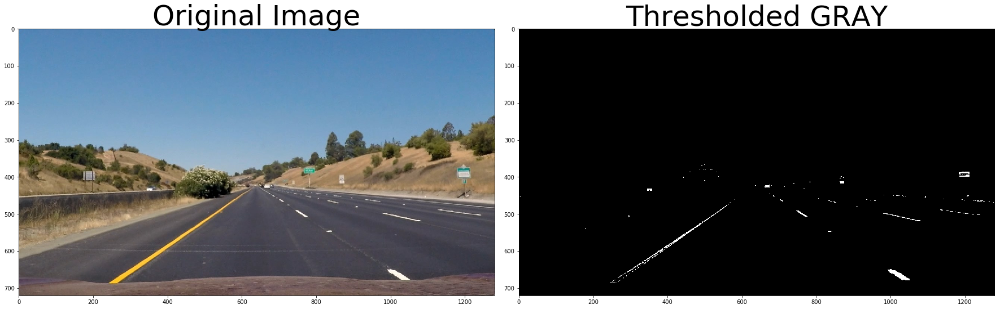

In [11]:
# Use color transforms, gradients, etc., to create a thresholded binary image.
# GRAY Threshold

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

# read image
image = mpimg.imread('test_images/straight_lines1.jpg')


def gray_select(img, thresh=(0, 255)):
    # convert to Gray
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Apply threshold
    binary = np.zeros_like(gray)
    binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    
    return binary

gray_binary = gray_select(image, (200, 255))

# Plot the gray result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(gray_binary, cmap='gray')
ax2.set_title('Thresholded GRAY', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()
 
# Histogram 
#histogram = np.sum(gray_binary[gray_binary.shape[0]//2:,:], axis=0)
#plt.plot(histogram)
#plt.show()

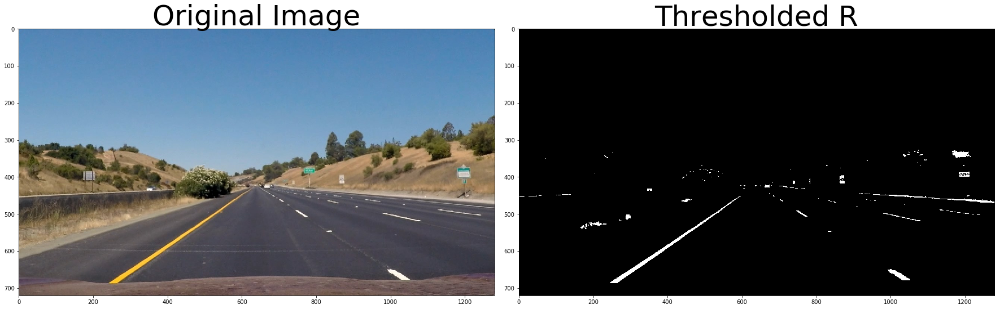

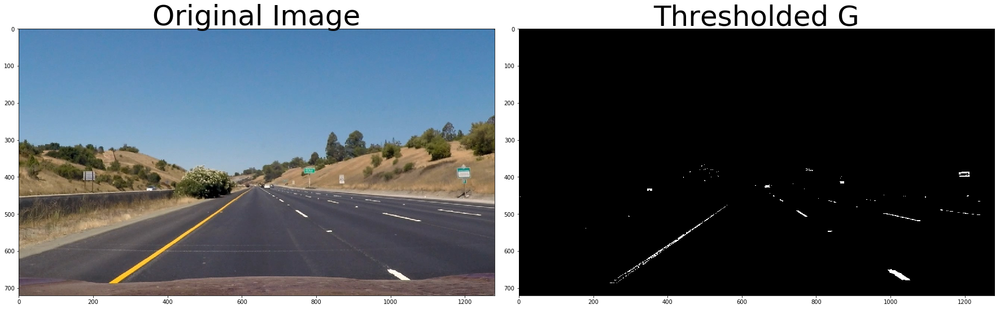

In [12]:
# RGB Threshold
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

# Read in an image, you can also try test1.jpg or test4.jpg
image = mpimg.imread('test_images/straight_lines1.jpg') 

# Define a function that thresholds the channels of RGB
def rgb_select(img, thresh=(0, 255)):
    # 1) Convert to RGB color space
    r_ch = img[:, :, 0]
    g_ch = img[:, :, 1]
    b_ch = img[:, :, 2]
    # 2) Apply a threshold to the channels
    r_binary_output = np.zeros_like(r_ch)
    r_binary_output[(r_ch > thresh[0]) & (r_ch <= thresh[1])]=1
    
    g_binary_output = np.zeros_like(g_ch)
    g_binary_output[(g_ch > thresh[0]) & (g_ch <= thresh[1])]=1
    
    b_binary_output = np.zeros_like(b_ch)
    b_binary_output[(b_ch > thresh[0]) & (b_ch <= thresh[1])]=1
    # 3) Return a binary image of threshold result
    return r_binary_output, g_binary_output, b_binary_output
    
r_binary, g_binary, b_binary  = rgb_select(image, thresh=(200, 255))

# Plot the R channel result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(r_binary, cmap='gray')
ax2.set_title('Thresholded R', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

# Histogram 
#histogram = np.sum(r_binary[r_binary.shape[0]//2:,:], axis=0)
#plt.plot(histogram)
#plt.show()

# Plot the G channel result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(g_binary, cmap='gray')
ax2.set_title('Thresholded G', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

# Plot the S result
#f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#f.tight_layout()
#ax1.imshow(image)
#ax1.set_title('Original Image', fontsize=50)
#ax2.imshow(b_binary, cmap='gray')
#ax2.set_title('Thresholded B', fontsize=50)
#plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#plt.show()

# Histogram 
#histogram = np.sum(g_binary[g_binary.shape[0]//2:,:], axis=0)
#plt.plot(histogram)
#plt.show()

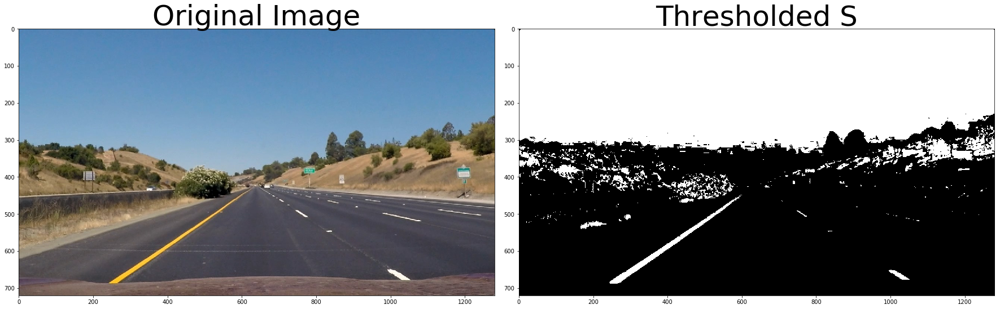

In [93]:
# ========================== HLS S-CHANNEL THRESHOLD ============================
# HLS Color Threshold
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

# Read in an image, you can also try 
image = mpimg.imread('test_images/straight_lines1.jpg') 

# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_thresh(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls_img = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_ch = hls_img[:, :, 2]
    # 2) Apply a threshold to the S channel
    s_binary_output = np.zeros_like(s_ch)
    s_binary_output[(s_ch > thresh[0]) & (s_ch <= thresh[1])]=1
    # 3) Return a binary image of threshold result
    return s_binary_output
    

s_binary  = hls_thresh(image, thresh=(90, 255))    

# Plot the S result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(s_binary, cmap='gray')
ax2.set_title('Thresholded S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

# Histogram 
#histogram = np.sum(s_binary[s_binary.shape[0]//2:,:], axis=0)
#plt.plot(histogram)
#plt.show()

In [100]:
# ========================== DEFINE AN IMAGE PROCESSING PIPELINE ============================
# Define the complete image processing pipeline, reads raw image and returns binary image with lane lines identified
# (hopefully)
def pipeline(img):
    # Undistort
    img_undistort = undistort_img(img, mtx, dist)
    
    # Perspective Transform
    img_unwarp, M, Minv = unwarp(img_undistort, src, dst)

    # Sobel Absolute (using default parameters)
    img_sobelAbs = abs_sobel_thresh(img_unwarp)

    # Sobel Magnitude (using default parameters)
    #img_sobelMag = mag_thresh(img_unwarp)
    
    # Sobel Direction (using default parameters)
    #img_sobelDir = dir_thresh(img_unwarp)
    
    # HLS S-channel Threshold (using default parameters)
    img_SThresh = hls_thresh(img_unwarp)

    # HLS L-channel Threshold (using default parameters)
    #img_LThresh = hls_lthresh(img_unwarp)

    
    # Combine HLS and Lab B channel thresholds
    combined = np.zeros_like(img_SThresh)
    combined[(img_sobelAbs == 1) | (img_SThresh == 1)] = 1
    return combined, Minv


# test pipeline
processed_img = pipeline(exampleImg)
plt.imshow(processed_img.asType(int))
plt.show()



AttributeError: 'tuple' object has no attribute 'asType'

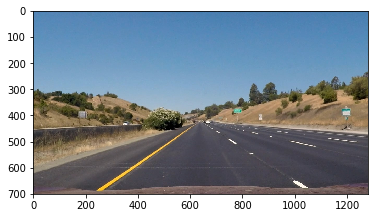

(700, 1280, 3)
top left x =  620
top left y =  441.0
top right x =  660
top right y =  441.0
bottom right x =  1103.0
bottom right y =  675
bottom left x =  249.0
bottom left y =  675


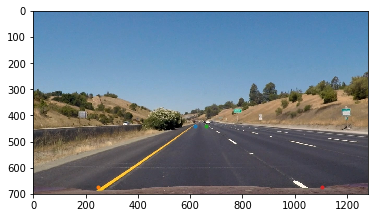

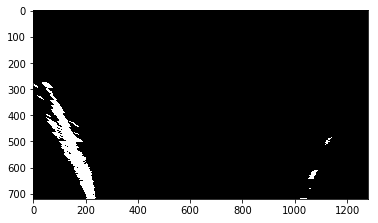

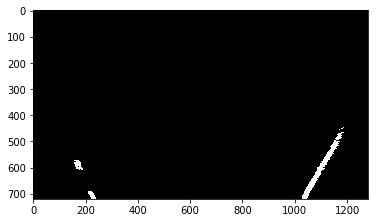

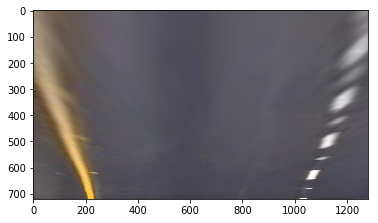

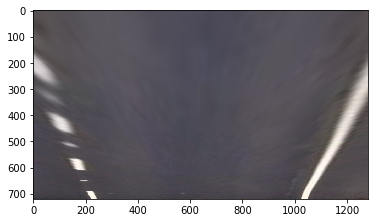

In [117]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read images
image = mpimg.imread('./test_images/straight_lines1.jpg')
image_2 = mpimg.imread('./test_images/straight_lines2.jpg')
# get image size
img_size = (image.shape[1], image.shape[0])
img2_size = (image_2.shape[1], image_2.shape[0])
# Crop images
image = crop_img(image, 0, 700, 0, 1280)
image_2 = crop_img(image_2, 0, 700, 0, 1280)
# display cropped images
plt.imshow(image)
plt.show()
print(image.shape)
# calculate the S-channel threshold
hls_img = hls_select(image, thresh=(90, 255))
hls_img_2 = hls_select(image_2, thresh=(90, 255))

#plt.imshow(hls_img, cmap='gray')
#plt.show()

# selecting src and dst points and drawing them on image
# source points to enclose lane line in a trapezoid.

offset_x = 20
offset_y = 5

top_left_y = cropped_exampleImg.shape[0]//1.54
top_left_x = cropped_exampleImg.shape[1]//2 - offset_x
print('top left x = ', top_left_x)
print('top left y = ', top_left_y)

top_right_y = cropped_exampleImg.shape[0]//1.54
top_right_x = cropped_exampleImg.shape[1]//2 + offset_x
print('top right x = ', top_right_x)
print('top right y = ', top_right_y)

bottom_right_y = cropped_exampleImg.shape[0] - offset_y
bottom_right_x = cropped_exampleImg.shape[1]//1.16
print('bottom right x = ', bottom_right_x)
print('bottom right y = ', bottom_right_y)

bottom_left_y = cropped_exampleImg.shape[0] - offset_y
bottom_left_x = cropped_exampleImg.shape[1]//5.12
print('bottom left x = ', bottom_left_x)
print('bottom left y = ', bottom_left_y)

# Store source points
src = np.float32([[top_left_x, top_left_y],
                  [top_right_x, top_right_y],
                  [bottom_right_x, bottom_right_y],
                  [bottom_left_x, bottom_left_y]])
# destination points to display warp image
dst = np.float32([[200, 0],
                 [1100, 0],
                 [1100, 720],
                 [200, 720]])

plt.imshow(image)
plt.plot(top_left_x, top_left_y, '.')
plt.plot(bottom_left_x, bottom_left_y, '.')
plt.plot(top_right_x, top_right_y, '.')
plt.plot(bottom_right_x, bottom_right_y, '.')
plt.show()

M = cv2.getPerspectiveTransform(src, dst)
#warped = perspective_transform(hls_img, M)
warped = cv2.warpPerspective(hls_img, M, img_size, flags=cv2.INTER_LINEAR)
warped_2 = cv2.warpPerspective(hls_img_2, M, img2_size, flags=cv2.INTER_LINEAR)

plt.imshow(warped, cmap='gray')
plt.show()

plt.imshow(warped_2, cmap='gray')
plt.show()


original_warped = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)
plt.imshow(original_warped)
plt.show()

original_warped_2 = cv2.warpPerspective(image_2, M, img_size, flags=cv2.INTER_LINEAR)
plt.imshow(original_warped_2)
plt.show()

bottom right x =  1103.0


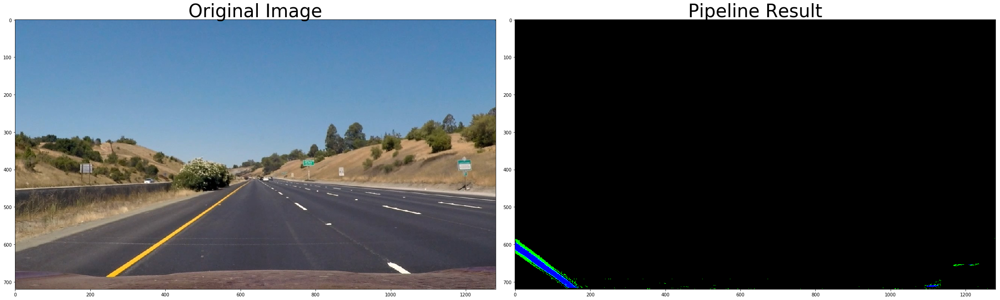

In [115]:
#################################### DEFINE AN IMAGE PROCESSING PIPELINE ###############################

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


image = mpimg.imread('./test_images/straight_lines1.jpg')

# Edit this function to create your own pipeline.
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 50)):
    img = np.copy(img)
    img = perspective_transform(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    
    apex, apey = 360, 258
    offset_far = 50
    offset_near = 10
    src = np.float32([[int(apex-offset_far),apey],
                      [int(apex+offset_far),apey],
                      [int(0+offset_near),390],
                      [int(720-offset_near),390]])
    dst = np.float32([[0,0],[720,0],[0,405],[720,405]])
    M = cv2.getPerspectiveTransform(src, dst)
    
    return color_binary
    
result = pipeline(image)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 19))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

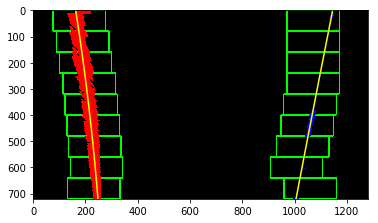

In [21]:
# ========================== FINDING LINES WITH SLIDING WINDOW ============================
import numpy as np
import cv2
import matplotlib.pyplot as plt

#Convert this to a function. complete 
#def findLines(warped_binary):
# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((warped, warped, warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = warped.shape[0] - (window+1)*window_height
    win_y_high = warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0, 255, 0), 3) 
    cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0, 255, 0), 3) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

# Generate x and y values for plotting
ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.show()

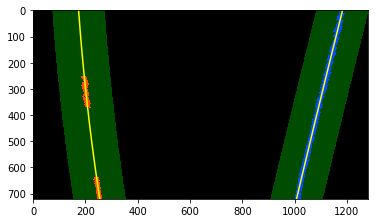

In [22]:
# ========================== FINDING LINES USING PREVIOUS POLYFIT ============================

# Skip the sliding windows step once you know where the lines are

# Now you know where the lines are you have a fit! In the next frame of video you don't need to do a blind search again,
# but instead you can just search in a margin around the previous line position like this:

# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
binary_warped = warped_2
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# And you're done! But let's visualize the result here as well

# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.show()


In [23]:
# ========================== DETERMINE RADIUS OF CURVATURE ============================

import numpy as np
import matplotlib.pyplot as plt
# Generate some fake data to represent lane-line pixels
ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
# For each y position generate random x position within +/-50 pix
# of the line base position in each case (x=200 for left, and x=900 for right)
leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                              for y in ploty])
rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                for y in ploty])

leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


# Fit a second order polynomial to pixel positions in each fake lane line
left_fit = np.polyfit(ploty, leftx, 2)
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fit = np.polyfit(ploty, rightx, 2)
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

# Define y-value where we want radius of curvature
# I'll choose the maximum y-value, corresponding to the bottom of the image
y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)
# Example values: 1926.74 1908.48

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')

1391.74362745 1682.29385247
455.26596417 m 552.537974411 m


In [24]:
# ========================== DEFINE A CLASS TO HOLD DATA FOR LINES ============================

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

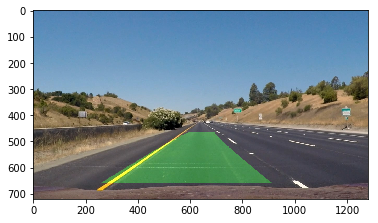

In [26]:
# ========================== DRAW LANE ONTO ORIGINAL IMAGE ============================

# Create an image to draw the lines on
warp_zero = np.zeros_like(warped).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
Minv = cv2.getPerspectiveTransform(dst, src)
# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
plt.imshow(result)
plt.show()

In [ ]:
# Method to determine radius of curvature and distance from lane center 
# based on binary image, polynomial fit, and L and R lane pixel indices
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist